## SCRAPING

In [1]:
# for performing your HTTP requests
import requests  

# for xml & html scrapping 
from bs4 import BeautifulSoup 

# for table analysis
import pandas as pd

# write to csv
import csv

#Visuals
import matplotlib.pyplot as plt

import seaborn as sns

import plotly.express as px
from plotly.offline import plot,iplot,init_notebook_mode
init_notebook_mode()

In [2]:
# url of wikipedia page from which you want to scrap tabular data.
url1 = "https://en.wikipedia.org/wiki/List_of_Nigerian_states_by_population"

In [3]:
# Session helps to object allows you to persist certain parameters across requests
# By default, Request will keep waiting for a response indefinitely. Therefore, it is advised to set the timeout parameter.
# If the request was successful, you should see the reponse output as '200'.
s = requests.Session()
response = s.get(url1, timeout=10)
#response2 = s.get(url2, timeout=5)
response

<Response [200]>

In [4]:
# parse response content to html
soup = BeautifulSoup(response.content, 'html.parser')

In [5]:
# to view the content in html format
pretty_soup = soup.prettify()

In [6]:
# title of Wikipedia page
soup.title.string

'List of Nigerian states by population - Wikipedia'

In [7]:
# find all the tables in the html
all_tables=soup.find_all('table')

In [8]:
# get the correct table to scrap
right_table=soup.find("table", {"class":"wikitable sortable"})
print(right_table)

<table class="wikitable sortable" style="margin: 1em 1em 1em 0; background: #f9f9f9; border: 1px #aaa solid; border-collapse: collapse; font-size: 95%;">
<tbody><tr bgcolor="#e8e8e8">
<th align="left" scope="col">Rank (2006)
</th>
<th align="left" scope="col">State
</th>
<th scope="col">Population (2006)
</th>
<th scope="col">Population (2016)
</th></tr>
<tr>
<td align="left">1
</td>
<td align="left"><a href="/wiki/Kano_State" title="Kano State">Kano State</a>
</td>
<td align="center">9,401,288
</td>
<td align="center">13,076,892
</td></tr>
<tr>
<td align="left">2
</td>
<td align="left"><a href="/wiki/Lagos_State" title="Lagos State">Lagos State</a>
</td>
<td align="center">9,113,605
</td>
<td align="center">12,550,598
</td></tr>
<tr>
<td align="left">3
</td>
<td align="left"><a href="/wiki/Kaduna_State" title="Kaduna State">Kaduna State</a>
</td>
<td align="center">6,113,503
</td>
<td align="center">8,252,366
</td></tr>
<tr>
<td align="left">4
</td>
<td align="left"><a href="/wiki/Kat

In [9]:
# Number of columns in the table
for row in right_table.findAll("tr"):
    cells = row.findAll('td')

len(cells)


4

In [10]:
# number of rows in the table including header
rows = right_table.findAll("tr")
len(rows)


38

In [11]:
# header attributes of the table
header = [th.text.rstrip() for th in rows[0].find_all('th')]
print(header)
print('------------')
print(len(header))

['Rank (2006)', 'State', 'Population (2006)', 'Population (2016)']
------------
4


In [12]:

#Loop through the rows of the table and store in a list

lst_data = []
for row in rows[1:]:
            data = [d.text.rstrip() for d in row.find_all('td')]
            lst_data.append(data)

In [13]:
# or use select,it also works as find_all
lst_data1 = []
for row in rows[1:]:
            data = [d.text.rstrip() for d in row.select('td')]
            lst_data1.append(data)


In [14]:
# example
lst_data1[0:3]

[['1', 'Kano State', '9,401,288', '13,076,892'],
 ['2', 'Lagos State', '9,113,605', '12,550,598'],
 ['3', 'Kaduna State', '6,113,503', '8,252,366']]

In [15]:

# length of each record
len(lst_data[0])

4

In [16]:
# html of each table record

list_row = []
for row in right_table.findAll("tr"):
    list_row.append(row)

    
print('Number of row :',len(list_row))
print('----------------')
print(list_row[1])
print('----------------')
print('Second Attribute is has link reference')
print('----------------')
print(list_row[1].findAll('th'))
print('----------------')
print(list_row[1].find('a').text)

Number of row : 38
----------------
<tr>
<td align="left">1
</td>
<td align="left"><a href="/wiki/Kano_State" title="Kano State">Kano State</a>
</td>
<td align="center">9,401,288
</td>
<td align="center">13,076,892
</td></tr>
----------------
Second Attribute is has link reference
----------------
[]
----------------
Kano State


In [17]:

#Scrap the data and append to respective lists

c1=[]
c2=[]
c3=[]
c4=[]

for row in right_table.findAll("tr"):
    cells = row.findAll('td')
    if len(cells)==4: #Only extract table body not heading
        c1.append(cells[0].find(text=True))
        c2.append(cells[1].find('a').text)  # fetch the text of the url in td tag. 
        c3.append(cells[2].find(text=True))
        c4.append(cells[3].find(text=True))
       

In [18]:

# create a dictionary
d = dict([(x,0) for x in header])
d


{'Rank (2006)': 0, 'State': 0, 'Population (2006)': 0, 'Population (2016)': 0}

In [19]:
# append dictionary with corresponding data list.
d['Rank'] = c1
d['State']= c2
d['Population (2006)']=c3
d['Population (2016)']=c4


In [20]:

# convert dict to DataFrame
df_table = pd.DataFrame(d)

# Top 5 records
df_table.head(4)

,Rank (2006),State,Population (2006),Population (2016),Rank
0,0,Kano State,"9,401,288","13,076,892",1
1,0,Lagos State,"9,113,605","12,550,598",2
2,0,Kaduna State,"6,113,503","8,252,366",3
3,0,Katsina State,"5,801,584","7,831,319",4


In [21]:
# Last 5 records
df_table.tail(4)

,Rank (2006),State,Population (2006),Population (2016),Rank
33,0,Ebonyi State,"2,176,947","2,880,383",34
34,0,Nasarawa State,"1,869,377","2,523,395",35
35,0,Bayelsa State,"1,704,515","2,277,961",36
36,0,Federal Capital Territory,"1,405,201","3,564,126",–


In [22]:

# rename column
df_5 = df_table.drop(['Rank (2006)'], axis=1)
df_5.rename(columns={"Rank": "Rank (2016)"})

,State,Population (2006),Population (2016),Rank (2016)
0,Kano State,"9,401,288","13,076,892",1
1,Lagos State,"9,113,605","12,550,598",2
2,Kaduna State,"6,113,503","8,252,366",3
3,Katsina State,"5,801,584","7,831,319",4
4,Oyo State,"5,580,894","7,840,864",5
5,Rivers State,"5,198,605","7,303,924",6
6,Bauchi State,"4,653,066","6,537,314",7
7,Jigawa State,"4,361,002","5,828,163",8
8,Benue State,"4,253,641","5,741,815",9
9,Anambra State,"4,177,828","5,527,809",10


In [43]:
#save as a csv
df_5.to_csv('naijapopu.csv')  

In [24]:
# repplace ',' and convert to float
df_5 ['Population (2006)'] = df_5['Population (2006)'].apply(lambda x: float(x.split()[0].replace(',', '')))
df_5 ['Population (2016)'] = df_5['Population (2016)'].apply(lambda x: float(x.split()[0].replace(',', '')))


## VISUALIZATIONS USING POPULATION IN 2016

### 1. BARCHAT

#### Matplotlib

In [61]:
#Sort States column alphabetically
dfsorted=df_5.sort_values('State', ascending=True)

Text(0.5, 1.0, 'Population of Nigeria in 2016 using barcharts in matlpotlib')

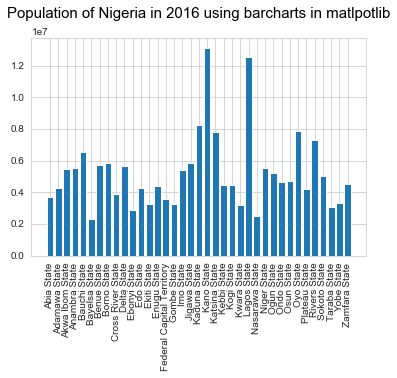

In [103]:
#to space the title
from matplotlib import rcParams
rcParams['axes.titlepad'] = 20 

plt.bar(dfsorted['State'],dfsorted['Population (2016)'])
y_pos = range(len(dfsorted['Population (2016)']))
plt.xticks(y_pos, dfsorted['State'], rotation=90)
plt.title(label="Population of Nigeria in 2016 using barcharts in matlpotlib", fontsize=15,  color="black") 


#### Seaborn

Text(0.5, 1.0, 'Population of Nigeria in 2016 using barcharts in seaborn')

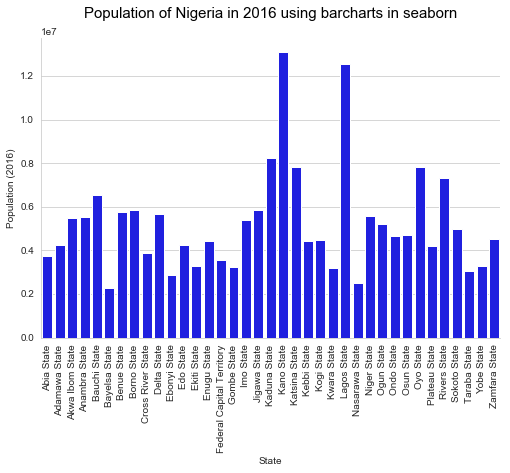

In [105]:

import seaborn as sns

#to space the title
from matplotlib import rcParams
rcParams['axes.titlepad'] = 20 

#sns.catplot(x='State',y='Population (2016)',data=df_5,kind="bar")

g = sns.catplot(x="State", data=dfsorted, aspect=1.5, y="Population (2016)", color="b",kind ='bar')
g.set_xticklabels(rotation=90)
plt.title(label="Population of Nigeria in 2016 using barcharts in seaborn", fontsize=15,  color="black") 

#### Plotly

In [95]:
import plotly.express as px
from plotly.offline import plot,iplot,init_notebook_mode
init_notebook_mode()

fig = px.bar(dfsorted, x='State', y='Population (2016)',title='Population of Nigeria in 2016 using barcharts in plotly')
fig.show()

### 2 PIECHART

#### Matplotlib

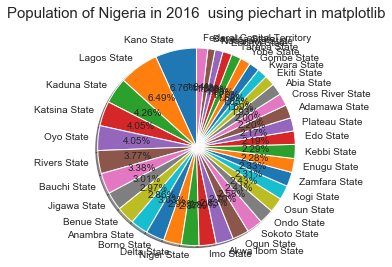

In [106]:
import matplotlib.pyplot as plt
#to space the title
from matplotlib import rcParams
rcParams['axes.titlepad'] = 20 

# Pie chart, where the slices will be ordered and plotted counter-clockwise:
labels =df_5["State"]
sizes = df_5["Population (2016)"]
#explode = (0, 0.1, 0, 0) 
fig1, ax1 = plt.subplots()
ax1.pie(sizes,labels=labels, autopct='%1.2f%%',
        shadow=True, startangle=90 )
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
ax1.set_title("Population of Nigeria in 2016  using piechart in matplotlib", fontsize=15)

plt.show()


#### Plotly

In [97]:
import plotly.express as px
from plotly.offline import plot,iplot,init_notebook_mode
init_notebook_mode()

fig = px.pie(df_5, values='Population (2016)', names='State', title='Population of Nigeria in 2016 using piechart in plotly')
fig.show()

#### Seaborn : Piechart is not directly avaliable, so we use barchart with percents

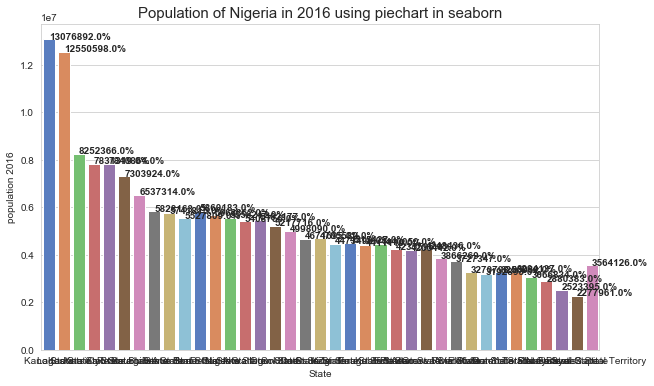

In [98]:
sns.set_style("whitegrid")
bar,ax = plt.subplots(figsize=(10,6))
ax = sns.barplot(x='State', y='Population (2016)', data=df_5, ci=None, palette="muted",orient='v', )
ax.set_title("Population of Nigeria in 2016 using piechart in seaborn", fontsize=15)
ax.set_xlabel ("State")
ax.set_ylabel ("population 2016")
# calculate the percentages
for rect in ax.patches:
    ax.text (rect.get_x() + rect.get_width() / 2,rect.get_height(),"%.1f%%"% rect.get_height(), weight='bold' )
    

bar.savefig("Seaborn_Pie_Chart.png");

### 3. MAPS

#### plotly

In [31]:
import json
import numpy as np
#load geojsonfile for nigeria
naija_states = json.load(open("nigeria_geojson.geojson", "r"))

In [32]:
naija_states["features"][4]["properties"]

{'objectid': '1254',
 'statecode': 'DE',
 'state': 'Delta',
 'capcity': 'Asaba',
 'source': 'WHO',
 'timestamp': '1855851096',
 'globalid': '{99C8D1D1-4342-41F3-8E59-E293FB7B6ACB}',
 'shape_area': '1.36119458474685',
 'shape_len': '8.78236707514049',
 'geozone': 'SSZ',
 'cartodb_id': 10,
 'created_at': '2015-04-03T18:35:50Z',
 'updated_at': '2015-04-03T18:35:50Z'}

In [33]:
#create a dictionary from the features of the geojson, so it cna be used to identify states
state_id_map = {}
for feature in naija_states["features"]:
    feature["id"] = feature["properties"]["cartodb_id"]
    state_id_map[feature["properties"]["state"]] = feature["id"]

In [111]:
state_id_map

{'Fct, Abuja': 3,
 'Benue': 6,
 'Osun': 7,
 'Imo': 9,
 'Delta': 10,
 'Abia': 11,
 'Rivers': 12,
 'Edo': 13,
 'Taraba': 37,
 'Cross River': 1,
 'Niger': 36,
 'Nasarawa': 2,
 'Akwa Ibom': 15,
 'Kogi': 16,
 'Plateau': 17,
 'Lagos': 19,
 'Ondo': 20,
 'Kwara': 21,
 'Adamawa': 5,
 'Ogun': 22,
 'Enugu': 8,
 'Bauchi': 35,
 'Ebonyi': 4,
 'Kebbi': 34,
 'Bayelsa': 14,
 'Anambra': 18,
 'Ekiti': 23,
 'Oyo': 24,
 'Kano': 25,
 'Katsina': 26,
 'Yobe': 27,
 'Jigawa': 28,
 'Sokoto': 29,
 'Borno': 30,
 'Zamfara': 31,
 'Kaduna': 32,
 'Gombe': 33}

In [35]:
#READ THE DATAFRAME('Federal Capital Territory' was changed to 'FCT, Abuja')
#save as a csv
#df_5.to_csv('naijapopu.csv')  
df6=pd.read_csv("naijapopu.csv")

In [36]:
#Remove States and whitespaces
df6["Statereplaced"]=df6["State"].apply(lambda x: x.split("State")[0])
df6["Statereplacedd"]=df6["Statereplaced"].apply(lambda x: x.rstrip())
df6["Statereplacedd"][0]

'Kano'

In [37]:
#create new id column that uses the id in the state_id_map dictionary to identify state

df6["id"] = df6["Statereplacedd"].apply(lambda x: state_id_map[x])

In [45]:

print(sum(df6['Population (2016)']))

193500543


In [99]:
fig = px.choropleth(
    df6,
    locations="id",
    geojson=naija_states,
    color="Population (2016)",
    hover_name="State",
   
    title="Nigeria Population in 2016 using map in plotly",
    color_continuous_scale=px.colors.diverging.BrBG,
    color_continuous_midpoint=0,
)
fig.update_geos(fitbounds="locations", visible=False)
fig.show()

In [100]:
#mapbox for better plotting
fig = px.choropleth_mapbox(
    df6,
    locations="id",
    geojson=naija_states,
    color="Population (2016)",
    hover_name="State",
    
    title="Nigeria Population in 2016 using map in plotly",
    mapbox_style="carto-positron",
    center={"lat": 9, "lon": 8},
    zoom=3,
    opacity=0.5,
)
fig.show()